In [1]:
#調用操作系統命令(查詢文件)
import os 

#機器學習模組
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
#標準化
from sklearn.preprocessing import StandardScaler

# 視覺化函式庫
import matplotlib.pyplot as plt
from matplotlib.pyplot import MultipleLocator
import matplotlib as mpl
import seaborn as sns
%matplotlib inline

# 資料加工、處理、分析函式庫
import numpy as np
import numpy.random as random
import scipy as sp
from pandas import Series, DataFrame
import pandas as pd

# 讀取空氣品質資料

In [2]:
path = 'airquality'
files = os.listdir(path)
#定義一個空列表
data_list = []
#aqi轉換分級
def aqi_to_level(aqi):
    if aqi <= 50:
        return 1
    elif aqi <= 100:
        return 2
    elif aqi <= 150:
        return 3
    elif aqi <= 200:
        return 4
    elif aqi <= 300:
        return 5
    else:
        return 6

# 迴圈讀取檔案
for file in files:
    tmp = pd.read_csv(path + '/' + file)[['\"sitename\"', '\"monitordate\"', '\"aqi\"']]
    data_list.append(tmp)
    tmp['aqiLevel'] = tmp['\"aqi\"'].map(aqi_to_level)
airquality = pd.concat(data_list)
airquality = airquality.rename(columns={'\"sitename\"': 'sitename', '\"monitordate\"' : '觀測時間(day)', '\"aqi\"' : 'aqi'})
airquality

,sitename,觀測時間(day),aqi,aqiLevel
0,松山,2016-09-01,156.0,4
1,富貴角,2016-09-01,-1.0,1
2,麥寮,2016-09-01,105.0,3
3,關山,2016-09-01,33.0,1
4,馬公,2016-09-01,73.0,2
...,...,...,...,...
2335,馬公,2022-11-30,34.0,1
2336,關山,2022-11-30,31.0,1
2337,麥寮,2022-11-30,56.0,2
2338,富貴角,2022-11-30,38.0,1


# 讀取氣象測站觀測資料

In [3]:
path = 'weather'
files = os.listdir(path)
#定義一個空列表
data_list = []
#宣告字典，對應檔名測站代號
station_dict = {'萬華': '466920', '板橋': '466880', '基隆': '466940', '觀音': '467050', '湖口': 'C0D650', '新竹': 'C0D660', 
                '頭份': 'C0E730', '大里': '467490', '彰化': '467270', '埔里': 'C0H890', '臺西': 'C0K530', '朴子': 'C0M650', 
                '嘉義': '467480', '臺南': '467410', '楠梓': '467440', '恆春': '467590', '宜蘭': '467080', '花蓮': '466990', 
                '臺東': '467660', '馬公': '467350', '金門': '467110', '馬祖': '467990'}
#反轉key-value
station_dict = {v : k for k, v in station_dict.items()}


#區域分類
def region(sitename):    
    if sitename == '萬華' or sitename == '板橋' or sitename == '基隆' or sitename == '觀音' or sitename == '湖口' or sitename == '新竹' or sitename == '頭份' :
        return 'n'
    if sitename == '大里' or sitename == '彰化' or sitename == '埔里' or sitename == '臺西':
        return 'm'
    if sitename == '朴子' or sitename == '嘉義' or sitename == '臺南' or sitename == '楠梓' or sitename == '恆春':
        return 's'
    if sitename == '宜蘭' or sitename == '花蓮' or sitename == '臺東':
        return 'e'
    if sitename == '馬公' or sitename == '金門' or sitename == '馬祖':
        return 'o'
    
# 迴圈讀取檔案
for file in files:
    tmp = pd.read_csv(path + '/' + file)[['觀測時間(day)' , '氣溫(℃)', '相對溼度(%)', '風速(m/s)', '風向(360degree)', '降水量(mm)', '日最高紫外線指數']]
    tmp = tmp.drop(0, axis = 0)
    file = file.split('-')
    tmp.insert(0, 'sitename', station_dict[file[0]])
    tmp['觀測時間(day)'] = [file[1] + '-' + file[2][0:2] + '-% s' % i for i in tmp['觀測時間(day)']]
    tmp['region'] = tmp['sitename'].map(region)
    tmp.insert(1, 'month', int(file[2][0:2]))
    tmp['P'] = tmp['降水量(mm)'].map(lambda x: 0 if x == '0.0' else 1)
    tmp = tmp.drop('降水量(mm)', axis = 1)
    data_list.append(tmp)
weather_obs = pd.concat(data_list)
weather_obs = weather_obs.rename(columns={'氣溫(℃)': 'T', '相對溼度(%)' : 'RH', '風速(m/s)' : 'WS', '風向(360degree)' : 'WD', '日最高紫外線指數' : 'UVI'})
weather_obs

,sitename,month,觀測時間(day),T,RH,WS,WD,UVI,region,P
1,板橋,9,2016-09-01,29.2,60,1.3,260,...,n,0
2,板橋,9,2016-09-02,28.3,73,1.1,70,...,n,1
3,板橋,9,2016-09-03,27.8,82,1.4,70,...,n,1
4,板橋,9,2016-09-04,30.1,70,2.7,70,...,n,0
5,板橋,9,2016-09-05,29.3,74,2.6,70,...,n,1
...,...,...,...,...,...,...,...,...,...,...
26,朴子,11,2022-11-26,23.1,86,1.2,0,...,s,0
27,朴子,11,2022-11-27,23.8,85,0.6,0,...,s,0
28,朴子,11,2022-11-28,26.1,83,1.0,0,...,s,0
29,朴子,11,2022-11-29,26.7,85,0.7,0,...,s,0


# 合併兩者資料

In [4]:
#抓sitename、觀測時間相同的值做合併
all_data = pd.merge(airquality, weather_obs, on = ['sitename', '觀測時間(day)'])
all_data

,sitename,觀測時間(day),aqi,aqiLevel,month,T,RH,WS,WD,UVI,region,P
0,馬公,2016-09-01,73.0,2,9,28.9,79,3.6,190,9,o,0
1,金門,2016-09-01,77.0,2,9,29.0,83,2.4,190,8,o,0
2,馬祖,2016-09-01,117.0,3,9,28.1,79,3.8,200,6,o,0
3,埔里,2016-09-01,102.0,3,9,26.3,72,0.8,211,...,m,0
4,宜蘭,2016-09-01,63.0,2,9,27.8,66,1.9,280,8,e,0
...,...,...,...,...,...,...,...,...,...,...,...,...
50131,宜蘭,2022-11-30,29.0,1,11,19.9,93,3.0,50,4,e,1
50132,埔里,2022-11-30,40.0,1,11,24.1,70,0.7,0,...,m,0
50133,馬祖,2022-11-30,27.0,1,11,12.8,94,7.8,30,1,o,1
50134,金門,2022-11-30,26.0,1,11,17.0,83,7.9,50,2,o,0


# 檢查有無空值或觀測異常值

In [5]:
all_data = all_data.drop(['sitename', '觀測時間(day)'], axis = 1)

In [6]:
print(all_data.isnull().any())
print(all_data.isin(['X']).sum())
print(all_data.isin(['V']).sum())
print(all_data.isin(['/']).sum())
print(all_data.isin(['...']).sum())
all_data = all_data.dropna()
all_data = all_data.replace('/', np.nan).dropna()
all_data = all_data.replace('X', np.nan).dropna()
all_data = all_data.replace('...', np.nan).dropna()

aqi          True
aqiLevel    False
month       False
T           False
RH          False
WS          False
WD          False
UVI         False
region      False
P           False
dtype: bool
aqi          0
aqiLevel     0
month        0
T           31
RH          51
WS          17
WD          17
UVI         92
region       0
P            0
dtype: int64
aqi         0
aqiLevel    0
month       0
T           0
RH          0
WS          0
WD          0
UVI         0
region      0
P           0
dtype: int64
aqi         0
aqiLevel    0
month       0
T           8
RH          8
WS          6
WD          6
UVI         0
region      0
P           0
dtype: int64
aqi             0
aqiLevel        0
month           0
T            1643
RH           1643
WS           1643
WD           1643
UVI         17673
region          0
P               0
dtype: int64


In [7]:
all_data

,aqi,aqiLevel,month,T,RH,WS,WD,UVI,region,P
0,73.0,2,9,28.9,79,3.6,190,9,o,0
1,77.0,2,9,29.0,83,2.4,190,8,o,0
2,117.0,3,9,28.1,79,3.8,200,6,o,0
4,63.0,2,9,27.8,66,1.9,280,8,e,0
5,56.0,2,9,27.9,77,2.3,240,9,e,0
...,...,...,...,...,...,...,...,...,...,...
50130,31.0,1,11,22.5,81,6.5,40,6,e,1
50131,29.0,1,11,19.9,93,3.0,50,4,e,1
50133,27.0,1,11,12.8,94,7.8,30,1,o,1
50134,26.0,1,11,17.0,83,7.9,50,2,o,0


# 資料型別的轉換

In [8]:
print('資料型別的確認（型別轉換前）')
print(all_data.dtypes)
all_data = all_data.assign(T = pd.to_numeric(all_data['T']))
all_data = all_data.assign(RH = pd.to_numeric(all_data['RH']))
all_data = all_data.assign(WS = pd.to_numeric(all_data['WS']))
all_data = all_data.assign(WD = pd.to_numeric(all_data['WD']))
all_data = all_data.assign(UVI = pd.to_numeric(all_data['UVI']))
print('資料型別的確認（型別轉換後)')
print(all_data.dtypes)

資料型別的確認（型別轉換前）
aqi         float64
aqiLevel      int64
month         int64
T            object
RH           object
WS           object
WD           object
UVI          object
region       object
P             int64
dtype: object
資料型別的確認（型別轉換後)
aqi         float64
aqiLevel      int64
month         int64
T           float64
RH            int64
WS          float64
WD            int64
UVI           int64
region       object
P             int64
dtype: object


In [9]:
#類別變數1/0化
all_data = pd.get_dummies(all_data)
all_data

,aqi,aqiLevel,month,T,RH,WS,WD,UVI,P,region_e,region_m,region_n,region_o,region_s
0,73.0,2,9,28.9,79,3.6,190,9,0,0,0,0,1,0
1,77.0,2,9,29.0,83,2.4,190,8,0,0,0,0,1,0
2,117.0,3,9,28.1,79,3.8,200,6,0,0,0,0,1,0
4,63.0,2,9,27.8,66,1.9,280,8,0,1,0,0,0,0
5,56.0,2,9,27.9,77,2.3,240,9,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50130,31.0,1,11,22.5,81,6.5,40,6,1,1,0,0,0,0
50131,29.0,1,11,19.9,93,3.0,50,4,1,1,0,0,0,0
50133,27.0,1,11,12.8,94,7.8,30,1,1,0,0,0,1,0
50134,26.0,1,11,17.0,83,7.9,50,2,0,0,0,0,1,0


# 資料分割

In [10]:
X = all_data.drop(['aqi', 'aqiLevel'], axis = 1)
y = all_data["aqi"]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0, test_size = 0.2)

# 標準化處理

In [11]:
sc = StandardScaler()
#將數據減去平均值，再除以變異數
sc.fit(X_train)
X_train = sc.transform(X_train)
X_test = sc.transform(X_test)

In [12]:
from sklearn.linear_model import LinearRegression
# 建立線性迴歸模型
LR_model = LinearRegression()
LR_model.fit(X_train, y_train)
# 顯示迴歸係數
print('\n迴歸係數\n{}'.format(pd.Series(LR_model.coef_, index = X.columns)))
print('截距: {:.3f}'.format(LR_model.intercept_))
# 顯示判定係數
print('判定係數(train):{:.3f}'.format(LR_model.score(X_train,y_train)))
print('判定係數(test):{:.3f}'.format(LR_model.score(X_test,y_test)))


迴歸係數
month      -1.065266
T          -6.474940
RH         -6.971041
WS         -5.439702
WD          2.177731
UVI        -4.507642
P          -5.800842
region_e   -6.958738
region_m   -0.803657
region_n   -0.721025
region_o    4.653828
region_s    3.349204
dtype: float64
截距: 56.469
判定係數(train):0.316
判定係數(test):0.313


# 連接氣象局API進行預測

In [13]:
#HTTP請求方法
import requests

In [14]:
def fetch(location, element):
    url = 'https://opendata.cwb.gov.tw/api/v1/rest/datastore/F-D0047-091'
    api_key = 'CWB-5E6CA7B9-D0AD-4A37-A866-38DF47F8D8E2'
    params = {
        'Authorization': api_key,
        'locationName': location,
        'elementName': element
    }
    response = requests.get(url, params = params)
    return get_element_values(response.json())

def get_element_values(json):
    json
    res = json['records']['locations'][0]['location'][0]['weatherElement'][0]['time'][0:4]
    values = []
    for i in range(len(res)):
        values.append(res[i]['startTime'] + '~' + res[i]['endTime'])
        values.append(res[i]['elementValue'][0]['value'])
    values.insert(0, json['records']['locations'][0]['location'][0]['weatherElement'][0]['elementName'])
    return values
#fetch('臺北市', 'WS')

In [15]:
locations = ['宜蘭縣', '花蓮縣', '臺東縣', '澎湖縣', '金門縣', '連江縣', '臺北市', '新北市', '桃園市', '臺中市',
             '臺南市', '高雄市', '基隆市', '新竹縣', '新竹市', '苗栗縣', '彰化縣', '南投縣', '雲林縣', '嘉義縣',
             '嘉義市', '屏東縣']
elements = ['MinT', 'MaxT', 'RH', 'WS', 'WD', 'UVI', 'PoP12h']
forecast = []
for location in locations:
    res = [location]
    for element in elements:
        tmp = fetch(location, element)
        res.append(tmp)
    forecast.append(res)
forecast[0]

['宜蘭縣',
 ['MinT',
  '2022-12-27 06:00:00~2022-12-27 18:00:00',
  '14',
  '2022-12-27 18:00:00~2022-12-28 06:00:00',
  '15',
  '2022-12-28 06:00:00~2022-12-28 18:00:00',
  '15',
  '2022-12-28 18:00:00~2022-12-29 06:00:00',
  '15'],
 ['MaxT',
  '2022-12-27 06:00:00~2022-12-27 18:00:00',
  '18',
  '2022-12-27 18:00:00~2022-12-28 06:00:00',
  '16',
  '2022-12-28 06:00:00~2022-12-28 18:00:00',
  '18',
  '2022-12-28 18:00:00~2022-12-29 06:00:00',
  '16'],
 ['RH',
  '2022-12-27 06:00:00~2022-12-27 18:00:00',
  '85',
  '2022-12-27 18:00:00~2022-12-28 06:00:00',
  '99',
  '2022-12-28 06:00:00~2022-12-28 18:00:00',
  '99',
  '2022-12-28 18:00:00~2022-12-29 06:00:00',
  '99'],
 ['WS',
  '2022-12-27 06:00:00~2022-12-27 18:00:00',
  '2',
  '2022-12-27 18:00:00~2022-12-28 06:00:00',
  '1',
  '2022-12-28 06:00:00~2022-12-28 18:00:00',
  '2',
  '2022-12-28 18:00:00~2022-12-29 06:00:00',
  '2'],
 ['WD',
  '2022-12-27 06:00:00~2022-12-27 18:00:00',
  '偏東風',
  '2022-12-27 18:00:00~2022-12-28 06:00:00',
 

# 整理回應數據

In [16]:
from datetime import datetime

def get_month(f):
    res = ["month"]
    for i in range(1, 9, 2):
        time = f[1][i].split('~')[0]
        time = datetime.strptime(time, '%Y-%m-%d %H:%M:%S')
        res.append(time.month)
    return res

def WD_to_degree(direction):
    if '偏北' in direction:
        return 360
    if '東北' in direction:
        return 45
    if '偏東' in direction:
        return 90
    if '東南' in direction:
        return 135
    if '偏南' in direction:
        return 180
    if '西南' in direction:
        return 225
    if '偏西' in direction:
        return 270
    if '西北' in direction:
        return 315
    
def check_WS(speed):
    res = ''
    for s in speed:
        if(s.isdigit()):
            res += s
    return int(res)

def correct_UVI(f):
    UVI = ['UVI']
    time = f[5][1].split('~')[1]
    time = datetime.strptime(time, '%Y-%m-%d %H:%M:%S')
    if time.hour == 6:
        for i in range(2, 5, 2):
            UVI.append(0)
            UVI.append(int(f[6][i]))
    else:
        for i in range(2, 5, 2):
            UVI.append(int(f[6][i]))
            UVI.append(0)
    #print(UVI)       
    return UVI

def partition(sitename):    
    if sitename == '臺北市' or sitename == '新北市' or sitename == '基隆市' or sitename == '桃園市' or sitename == '新竹縣' or sitename == '新竹市' or sitename == '苗栗縣':
        return 'n'
    if sitename == '臺中市' or sitename == '彰化縣' or sitename == '南投縣' or sitename == '雲林縣':
        return 'm'
    if sitename == '嘉義縣' or sitename == '嘉義市' or sitename == '臺南市' or sitename == '高雄市' or sitename == '屏東縣':
        return 's'
    if sitename == '宜蘭縣' or sitename == '花蓮縣' or sitename == '臺東縣':
        return 'e'
    if sitename == '澎湖縣' or sitename == '金門縣' or sitename == '連江縣':
        return 'o'

In [17]:
for f in forecast:
    T = ["T"]
    for i in range(2, 10, 2):
        avg = (int(f[1][i]) + int(f[2][i])) / 2   #計算平均溫度
        T.append(avg)
        f[3][i] = int(f[3][i])
        f[4][i] = check_WS(f[4][i])
        f[5][i] = WD_to_degree(f[5][i])
        f[7][i] = int(f[7][i]) / 100
    f.insert(1, get_month(f))
    f.insert(4, T)
    f.insert(8, correct_UVI(f))
    f.insert(11, partition(f[0]))
    del f[2:4] #刪除minT MaxT
    del f[7:8] #刪除 舊UVI
forecast

[['宜蘭縣',
  ['month', 12, 12, 12, 12],
  ['T', 16.0, 15.5, 16.5, 15.5],
  ['RH',
   '2022-12-27 06:00:00~2022-12-27 18:00:00',
   85,
   '2022-12-27 18:00:00~2022-12-28 06:00:00',
   99,
   '2022-12-28 06:00:00~2022-12-28 18:00:00',
   99,
   '2022-12-28 18:00:00~2022-12-29 06:00:00',
   99],
  ['WS',
   '2022-12-27 06:00:00~2022-12-27 18:00:00',
   2,
   '2022-12-27 18:00:00~2022-12-28 06:00:00',
   1,
   '2022-12-28 06:00:00~2022-12-28 18:00:00',
   2,
   '2022-12-28 18:00:00~2022-12-29 06:00:00',
   2],
  ['WD',
   '2022-12-27 06:00:00~2022-12-27 18:00:00',
   90,
   '2022-12-27 18:00:00~2022-12-28 06:00:00',
   180,
   '2022-12-28 06:00:00~2022-12-28 18:00:00',
   90,
   '2022-12-28 18:00:00~2022-12-29 06:00:00',
   315],
  ['UVI', 2, 0, 1, 0],
  ['PoP12h',
   '2022-12-27 06:00:00~2022-12-27 18:00:00',
   0.5,
   '2022-12-27 18:00:00~2022-12-28 06:00:00',
   0.6,
   '2022-12-28 06:00:00~2022-12-28 18:00:00',
   0.7,
   '2022-12-28 18:00:00~2022-12-29 06:00:00',
   0.8],
  'e'],
 ['花

# 分別取出各個時段的預報

In [18]:
def region_to_dummy(region):
    if region == 'e':
        return [1, 0, 0, 0, 0]
    if region == 'm':
        return [0, 1, 0, 0, 0]
    if region == 'n':
        return [0, 0, 1, 0, 0]
    if region == 'o':
        return [0, 0, 0, 1, 0]
    if region == 's':
        return [0, 0, 0, 0, 1]
        

period1 = []
period2 = []
period3 = []
period4 = []
for i in range(1, 5):
    for f in forecast:
        tmp = []
        tmp.append(f[0])
        tmp.append(f[1][i]) # month
        tmp.append(f[2][i]) # T
        for element in range(3, len(f)):
            if f[element][0] == 'UVI':
                tmp.append(f[6][i]) # UVI
                continue
            elif element == 8:
                tmp.extend(region_to_dummy(f[8])) # region
            else:
                tmp.append(f[element][2*i]) # 2*i
        if i == 1:
            period1.append(tmp)
        elif i == 2:
            period2.append(tmp)
        elif i == 3:
            period3.append(tmp)
        else:
            period4.append(tmp)
# period1            
period1 = pd.DataFrame(period1)
print(period1)
county_order = list(period1[0])
print(county_order)
period1 = period1.drop([0], axis = 1)
period1 = period1.values.tolist()
period2 = pd.DataFrame(period2)
period2 = period2.drop([0], axis = 1)
period2 = period2.values.tolist()
period3 = pd.DataFrame(period3)
period3 = period3.drop([0], axis = 1)
period3 = period3.values.tolist()
period4 = pd.DataFrame(period4)
period4 = period4.drop([0], axis = 1)
period4 = period4.values.tolist()
period1 = sc.fit_transform(period1)
period2 = sc.fit_transform(period2)
period3 = sc.fit_transform(period3)
period4 = sc.fit_transform(period4)
period1
# print(period2)
# print(period3)
# print(period4)

     0   1     2   3   4    5   6    7   8   9   10  11  12
0   宜蘭縣  12  16.0  85   2   90   2  0.5   1   0   0   0   0
1   花蓮縣  12  18.0  65   3   45   3  0.1   1   0   0   0   0
2   臺東縣  12  19.0  60   3   45   3  0.1   1   0   0   0   0
3   澎湖縣  12  18.0  66   8   45   8  0.0   0   0   0   1   0
4   金門縣  12  14.5  64   8   45   8  0.0   0   0   0   1   0
5   連江縣  12  12.0  81   9   45   9  0.0   0   0   0   1   0
6   臺北市  12  15.5  65   3   90   3  0.1   0   0   1   0   0
7   新北市  12  16.5  68   3   90   3  0.1   0   0   1   0   0
8   桃園市  12  15.5  65   3   45   3  0.1   0   0   1   0   0
9   臺中市  12  17.5  51   3   45   3  0.0   0   1   0   0   0
10  臺南市  12  17.0  59   3  360   3  0.0   0   0   0   0   1
11  高雄市  12  19.0  58   2  315   2  0.0   0   0   0   0   1
12  基隆市  12  16.0  67   4   45   4  0.4   0   0   1   0   0
13  新竹縣  12  15.5  64   5   45   5  0.0   0   0   1   0   0
14  新竹市  12  15.5  61   5   45   5  0.0   0   0   1   0   0
15  苗栗縣  12  15.0  62   4   45   4  0.0 

array([[ 0.        , -0.29719296,  2.7607086 , -0.92870533, -0.47535055,
        -0.92870533,  3.3606722 ,  2.51661148, -0.47140452, -0.68313005,
        -0.39735971, -0.54232614],
       [ 0.        ,  0.94818705,  0.32152831, -0.43037564, -0.8126961 ,
        -0.43037564,  0.28005602,  2.51661148, -0.47140452, -0.68313005,
        -0.39735971, -0.54232614],
       [ 0.        ,  1.57087705, -0.28826676, -0.43037564, -0.8126961 ,
        -0.43037564,  0.28005602,  2.51661148, -0.47140452, -0.68313005,
        -0.39735971, -0.54232614],
       [ 0.        ,  0.94818705,  0.44348733,  2.0612728 , -0.8126961 ,
         2.0612728 , -0.49009803, -0.39735971, -0.47140452, -0.68313005,
         2.51661148, -0.54232614],
       [ 0.        , -1.23122796,  0.1995693 ,  2.0612728 , -0.8126961 ,
         2.0612728 , -0.49009803, -0.39735971, -0.47140452, -0.68313005,
         2.51661148, -0.54232614],
       [ 0.        , -2.78795297,  2.27287254,  2.55960249, -0.8126961 ,
         2.55960249, -

In [19]:
predict1 = {}
predict2 = {}
predict3 = {}
predict4 = {}
count = 0
for p in period1:
    county = county_order[count]
    predict1[county] = round(list(LR_model.predict([p])).pop())
    count += 1
count = 0
for p in period2:
    county = county_order[count]
    predict2[county] = round(list(LR_model.predict([p])).pop())
    count += 1
count = 0
for p in period3:
    county = county_order[count]
    predict3[county] = round(list(LR_model.predict([p])).pop())
    count += 1
count = 0
for p in period4:
    county = county_order[count]
    predict4[county] = round(list(LR_model.predict([p])).pop())
    count += 1

print(predict1)
print(predict2)
print(predict3)
print(predict4)

{'宜蘭縣': 8, '花蓮縣': 29, '臺東縣': 29, '澎湖縣': 41, '金門縣': 57, '連江縣': 48, '臺北市': 58, '新北市': 52, '桃園市': 57, '臺中市': 65, '臺南市': 76, '高雄市': 73, '基隆市': 35, '新竹縣': 53, '新竹市': 55, '苗栗縣': 62, '彰化縣': 57, '南投縣': 78, '雲林縣': 70, '嘉義縣': 79, '嘉義市': 84, '屏東縣': 77}
{'宜蘭縣': 6, '花蓮縣': 26, '臺東縣': 45, '澎湖縣': 67, '金門縣': 80, '連江縣': 64, '臺北市': 49, '新北市': 42, '桃園市': 61, '臺中市': 64, '臺南市': 63, '高雄市': 72, '基隆市': 32, '新竹縣': 52, '新竹市': 52, '苗栗縣': 60, '彰化縣': 56, '南投縣': 66, '雲林縣': 66, '嘉義縣': 71, '嘉義市': 75, '屏東縣': 72}
{'宜蘭縣': 15, '花蓮縣': 31, '臺東縣': 32, '澎湖縣': 45, '金門縣': 65, '連江縣': 54, '臺北市': 50, '新北市': 43, '桃園市': 54, '臺中市': 71, '臺南市': 70, '高雄市': 76, '基隆市': 25, '新竹縣': 50, '新竹市': 49, '苗栗縣': 66, '彰化縣': 61, '南投縣': 74, '雲林縣': 72, '嘉義縣': 76, '嘉義市': 83, '屏東縣': 80}
{'宜蘭縣': 9, '花蓮縣': 30, '臺東縣': 45, '澎湖縣': 62, '金門縣': 86, '連江縣': 66, '臺北市': 45, '新北市': 39, '桃園市': 60, '臺中市': 63, '臺南市': 62, '高雄市': 69, '基隆市': 26, '新竹縣': 56, '新竹市': 59, '苗栗縣': 55, '彰化縣': 62, '南投縣': 65, '雲林縣': 64, '嘉義縣': 66, '嘉義市': 75, '屏東縣': 75}


# 資料視覺化

In [21]:
!pip install folium

In [20]:
import folium

In [21]:
data = pd.DataFrame()
data['countyname'] = ['臺東縣', '宜蘭縣', '臺北市', '雲林縣', '桃園市', '屏東縣', '臺中市', '臺南市', '基隆市' ,'連江縣', '南投縣', '澎湖縣', '苗栗縣', '嘉義市', '新竹縣', '新北市', '花蓮縣', '高雄市', '彰化縣', '嘉義縣', '金門縣', '新竹市']
data['countysn'] = ['10014001', '10002001', '63000001', '10009001', '10003001', '10013001', '10006001', '10011001', '10017001' , '09007001', '10008001', '10016001', '10005001', '10020001', '10004001', '10001001', '10015001', '10012001', '10007001', '10010001', '09020001', '10018001']
aqi = []
for county in data['countyname']:
    tmp = []
    tmp.append(predict1[county])
    tmp.append(predict2[county])
    tmp.append(predict3[county])
    tmp.append(predict4[county])
    aqi.append(tmp)
data['aqi'] = aqi

aqi1 = []
aqi2 = []
aqi3 = []
aqi4 = []
for county in data['countyname']:
    aqi1.append(predict1[county])
for county in data['countyname']:
    aqi2.append(predict2[county])
for county in data['countyname']:
    aqi3.append(predict3[county])
for county in data['countyname']:
    aqi4.append(predict4[county])
data['aqi1'] = aqi1
data['aqi2'] = aqi2
data['aqi3'] = aqi3
data['aqi4'] = aqi4
data

,countyname,countysn,aqi,aqi1,aqi2,aqi3,aqi4
0,臺東縣,10014001,"[29, 45, 32, 45]",29,45,32,45
1,宜蘭縣,10002001,"[8, 6, 15, 9]",8,6,15,9
2,臺北市,63000001,"[58, 49, 50, 45]",58,49,50,45
3,雲林縣,10009001,"[70, 66, 72, 64]",70,66,72,64
4,桃園市,10003001,"[57, 61, 54, 60]",57,61,54,60
5,屏東縣,10013001,"[77, 72, 80, 75]",77,72,80,75
6,臺中市,10006001,"[65, 64, 71, 63]",65,64,71,63
7,臺南市,10011001,"[76, 63, 70, 62]",76,63,70,62
8,基隆市,10017001,"[35, 32, 25, 26]",35,32,25,26
9,連江縣,09007001,"[48, 64, 54, 66]",48,64,54,66


In [22]:
tw_geo = 'twgeo.json'
period = ['aqi1', 'aqi2', 'aqi3', 'aqi4']

predictTime = []
for i in range(1, 9, 2):
    startTime = forecast[0][3][i].split('~')[0]
    endTime = forecast[0][3][i].split('~')[1]
    startTime = datetime.strptime(startTime, '%Y-%m-%d %H:%M:%S')
    endTime = datetime.strptime(endTime, '%Y-%m-%d %H:%M:%S')
    week = startTime.weekday()
    month = str(startTime.month)
    day = str(startTime.day)
    hour = endTime.hour
    day_or_night = (lambda x: '白天' if x == 18 else '晚上')
    weekday = (lambda x: '一' if x == 0 else ('二' if x == 1 else ('三' if x == 2 else ('四' if x == 3 else ('五' if x == 4 else ('六' if x == 5 else '日'))))))
    time = month + '/'+ day+ '('+ weekday(week) + ')' + ' ' + day_or_night(hour)
    print(time)
    predictTime.append(time)
    

fmap1 = folium.Map(location=[25.03, 121.3], zoom_start = 7.4)
fmap2 = folium.Map(location=[25.03, 121.3], zoom_start = 7.4)
fmap3 = folium.Map(location=[25.03, 121.3], zoom_start = 7.4)
fmap4 = folium.Map(location=[25.03, 121.3], zoom_start = 7.4)
fmap = [fmap1, fmap2, fmap3, fmap4]
res = []
for i in range(4):  
    choropleth = folium.Choropleth(
        geo_data = tw_geo,
        data = data,
        columns = ["countysn", period[i]],
        key_on = 'feature.properties.COUNTYSN',
        bins = [0,50,100,150,200,300, 500],
        fill_color = "YlOrRd",
        fill_opacity = 1,
        line_opacity = 0.7,
        legend_name = 'AQI',
    )
    choropleth.add_to(fmap[i])

    index = 0
    for feature in choropleth.geojson.data['features']:
        countysn = feature['properties']['COUNTYSN']  
        feature['properties'][period[i]] =  str(data[data['countysn'] == countysn][period[i]][index])
        feature['properties']['county'] = str(data[data['countysn'] == countysn]['countyname'][index])
        index += 1

    choropleth.geojson.add_child(
            folium.features.GeoJsonTooltip(['county', period[i]], labels = True)
    )
    title_html = '''
                 <h3 align="center" style="font-size:20px"><b>{predictTime}</b></h3>
                 '''.format(predictTime = predictTime[i])
    fmap[i].get_root().html.add_child(folium.Element(title_html))
    
fmap[0]

12/27(二) 白天
12/27(二) 晚上
12/28(三) 白天
12/28(三) 晚上


In [23]:
location = [['臺東', 22.75535, 121.15045], ['宜蘭', 24.74791, 121.74639], ['萬華', 25.04650, 121.50797], ['臺西', 23.70217, 120.19933],
            ['觀音', 25.03556, 121.08283], ['恆春', 21.95806, 120.78892], ['大里', 24.09961, 120.67844], ['臺南', 22.98525, 120.22238], 
            ['基隆', 25.12916, 121.76005], ['馬祖', 26.15188, 119.93149], ['埔里', 23.96884, 120.96790], ['馬公', 23.56903, 119.56615], 
            ['頭份', 24.69690, 120.89869], ['嘉義', 23.46477, 120.44125], ['湖口', 24.90009, 121.03886], ['板橋', 25.01297, 121.45866], 
            ['花蓮', 23.97130, 121.59976], ['楠梓', 22.73366, 120.32828], ['彰化', 24.06600, 120.54152], ['朴子', 23.46712, 120.24781], 
            ['金門', 24.43213, 118.31225], ['新竹', 24.80563, 120.97236]]
for i in range(4): 
    for j in location:
        folium.Circle(location = j[1:3],
                      color = 'red', # Circle 顏色
                      radius = 1500, # Circle 寬度
                      fill = True, # 填滿中間區域
                      fill_opacity = 0.9, # 設定透明度:1是完全不透
                      popup = j[0]
                     ).add_to(fmap[i])
        if i == 0:
            fmap[0].save('airquality1.html')
        elif i == 1:
            fmap[1].save('airquality2.html')
        elif i == 2:
            fmap[2].save('airquality3.html')
        elif i == 3:
            fmap[3].save('airquality4.html')


In [24]:
all_data = pd.merge(airquality, weather_obs, on = ['sitename', '觀測時間(day)'])
all_data = all_data.dropna()
all_data = all_data.replace('/', np.nan).dropna()
all_data = all_data.replace('X', np.nan).dropna()
all_data = all_data.replace('...', np.nan).dropna()
all_data = all_data.assign(T = pd.to_numeric(all_data['T']))
all_data = all_data.assign(RH = pd.to_numeric(all_data['RH']))
all_data = all_data.assign(WS = pd.to_numeric(all_data['WS']))
all_data = all_data.assign(WD = pd.to_numeric(all_data['WD']))
all_data = all_data.assign(UVI = pd.to_numeric(all_data['UVI']))
all_data

,sitename,觀測時間(day),aqi,aqiLevel,month,T,RH,WS,WD,UVI,region,P
0,馬公,2016-09-01,73.0,2,9,28.9,79,3.6,190,9,o,0
1,金門,2016-09-01,77.0,2,9,29.0,83,2.4,190,8,o,0
2,馬祖,2016-09-01,117.0,3,9,28.1,79,3.8,200,6,o,0
4,宜蘭,2016-09-01,63.0,2,9,27.8,66,1.9,280,8,e,0
5,花蓮,2016-09-01,56.0,2,9,27.9,77,2.3,240,9,e,0
...,...,...,...,...,...,...,...,...,...,...,...,...
50130,花蓮,2022-11-30,31.0,1,11,22.5,81,6.5,40,6,e,1
50131,宜蘭,2022-11-30,29.0,1,11,19.9,93,3.0,50,4,e,1
50133,馬祖,2022-11-30,27.0,1,11,12.8,94,7.8,30,1,o,1
50134,金門,2022-11-30,26.0,1,11,17.0,83,7.9,50,2,o,0


In [209]:
all_data[all_data['觀測時間(day)'] == '2022-08-27']

,sitename,觀測時間(day),aqi,aqiLevel,month,T,RH,WS,WD,UVI,region,P
48024,恆春,2022-08-27,29.0,1,8,29.6,79,1.7,340,11,s,0
48025,臺東,2022-08-27,31.0,1,8,29.7,73,1.3,330,12,e,0
48026,花蓮,2022-08-27,31.0,1,8,29.2,72,2.4,120,13,e,1
48027,宜蘭,2022-08-27,47.0,1,8,29.1,80,1.8,80,10,e,1
48029,馬祖,2022-08-27,80.0,2,8,28.5,91,2.1,10,12,o,0
48030,金門,2022-08-27,232.0,5,8,29.9,84,2.1,160,11,o,0
48031,馬公,2022-08-27,48.0,1,8,29.5,89,1.5,180,10,o,0
48033,萬華,2022-08-27,87.0,2,8,31.0,62,1.7,170,11,n,0
48034,觀音,2022-08-27,46.0,1,8,29.9,82,3.1,240,12,n,0
48038,大里,2022-08-27,47.0,1,8,30.0,69,1.0,220,12,m,0


In [25]:
all_data.describe()

,aqi,aqiLevel,month,T,RH,WS,WD,UVI,P
count,32335.000000,32335.000000,32335.000000,32335.000000,32335.000000,32335.000000,32335.000000,32335.000000,32335.000000
mean,56.510438,1.559610,6.674130,24.001781,77.750302,2.837925,165.312510,7.319901,0.408505
std,31.219024,0.721821,3.444338,4.929699,8.992385,1.695015,122.908433,3.369132,0.491565
min,-1.000000,1.000000,1.000000,4.200000,35.000000,0.200000,10.000000,0.000000,0.000000
25%,35.000000,1.000000,4.000000,20.500000,72.000000,1.700000,50.000000,5.000000,0.000000
50%,46.000000,1.000000,7.000000,24.800000,78.000000,2.300000,150.000000,7.000000,0.000000
75%,71.000000,2.000000,10.000000,28.300000,84.000000,3.400000,280.000000,10.000000,1.000000
max,232.000000,5.000000,12.000000,33.200000,100.000000,13.500000,360.000000,18.000000,1.000000


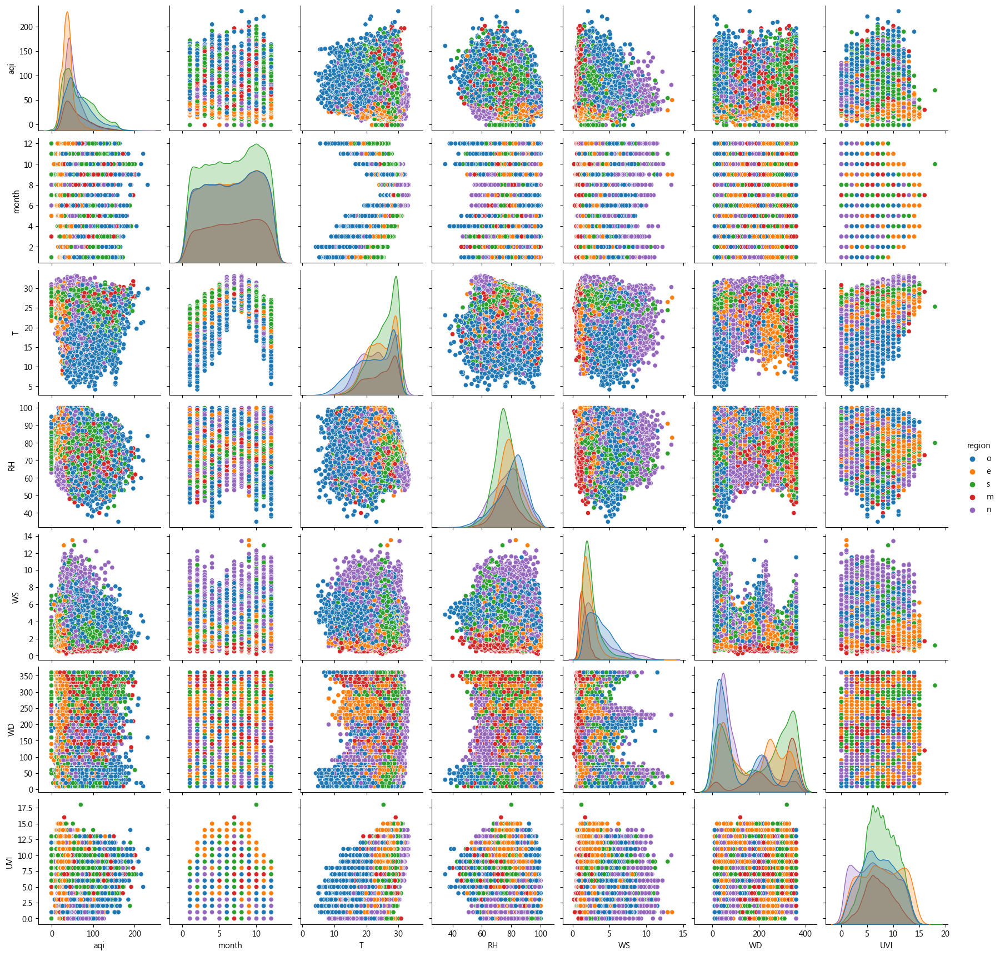

In [26]:
sns.pairplot(all_data.drop(['aqiLevel','P'], axis = 1), hue="region")

Text(0, 0.5, 'Average AQI')

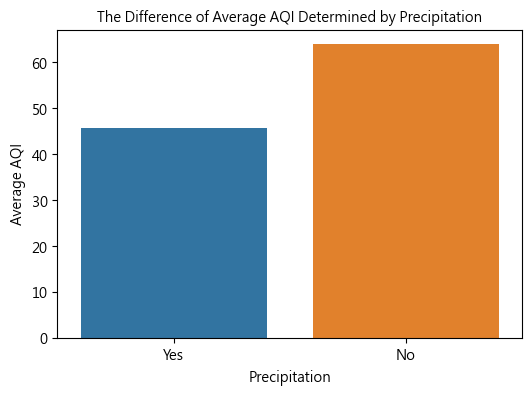

In [27]:
plt.figure(figsize=(6, 4))
sns.barplot(x = 'P', y = 'aqi', data = all_data, order = [1, 0], ci = None).set_xticklabels(['Yes', 'No'])
plt.title('The Difference of Average AQI Determined by Precipitation', fontsize = 10)
plt.xlabel('Precipitation', fontsize = 10)
plt.ylabel('Average AQI', fontsize = 10)

Text(0, 0.5, 'Average AQI')

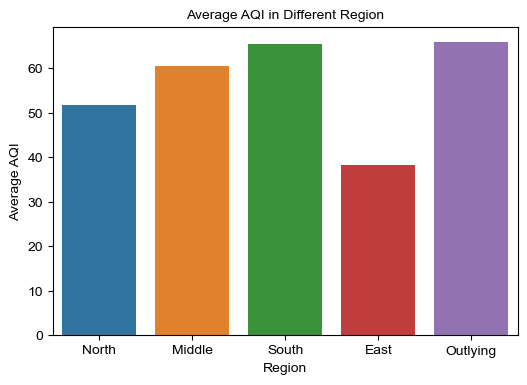

In [28]:
plt.figure(figsize=(6, 4))
sns.barplot(x = 'region', y = 'aqi', data = all_data, order = ['n', 'm', 's', 'e', 'o'], ci = None).set_xticklabels(['North', 'Middle', 'South', 'East', 'Outlying'])
sns.set(style = 'ticks', color_codes = True)
plt.title('Average AQI in Different Region', fontsize = 10)
plt.xlabel('Region', fontsize = 10)
plt.ylabel('Average AQI', fontsize = 10)

Text(0, 0.5, 'Average AQI')

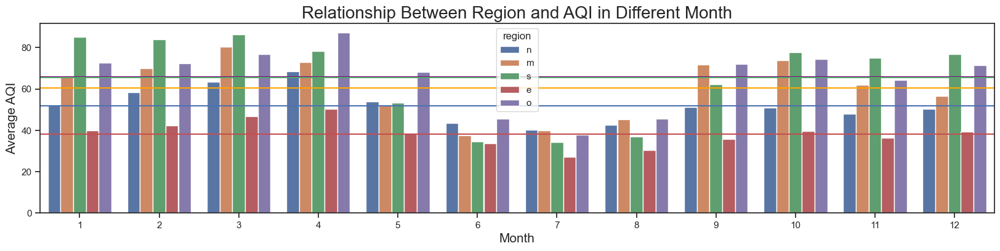

In [29]:
plt.figure(figsize=(20, 4))
sns.barplot(x = 'month', y = 'aqi', data = all_data, hue = 'region', hue_order = ['n', 'm', 's', 'e', 'o'], ci = None)
sns.set(style = 'ticks', color_codes = True)
plt.axhline(y = all_data.groupby('region')['aqi'].mean()[0], color = 'r', linestyle = '-')
plt.axhline(y = all_data.groupby('region')['aqi'].mean()[1], color = 'orange', linestyle = '-')
plt.axhline(y = all_data.groupby('region')['aqi'].mean()[2], color = 'b', linestyle = '-')
plt.axhline(y = all_data.groupby('region')['aqi'].mean()[3], color = 'purple', linestyle = '-')
plt.axhline(y = all_data.groupby('region')['aqi'].mean()[4], color = 'g', linestyle = '-')
plt.title('Relationship Between Region and AQI in Different Month', fontsize = 20)
plt.xlabel('Month', fontsize = 15)
plt.ylabel('Average AQI', fontsize = 15)

Text(0, 0.5, 'Average AQI')

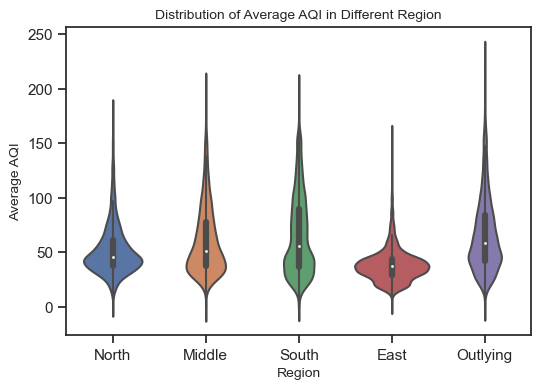

In [30]:
plt.figure(figsize=(6, 4))
sns.violinplot(x = 'region', y = 'aqi', data = all_data, order = ['n', 'm', 's', 'e', 'o']).set_xticklabels(['North', 'Middle', 'South', 'East', 'Outlying'])
sns.set(style = 'ticks', color_codes = True)
plt.title('Distribution of Average AQI in Different Region', fontsize = 10)
plt.xlabel('Region', fontsize = 10)
plt.ylabel('Average AQI', fontsize = 10)

Text(0, 0.5, 'Average AQI')

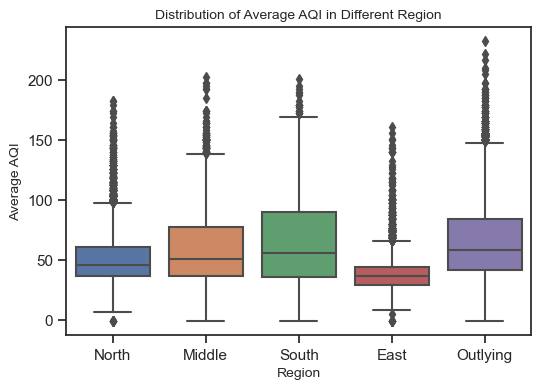

In [31]:
plt.figure(figsize=(6, 4))
sns.boxplot(x = 'region', y = 'aqi', data = all_data, order = ['n', 'm', 's', 'e', 'o']).set_xticklabels(['North', 'Middle', 'South', 'East', 'Outlying'])
sns.set(style = 'ticks', color_codes = True)
plt.title('Distribution of Average AQI in Different Region', fontsize = 10)
plt.xlabel('Region', fontsize = 10)
plt.ylabel('Average AQI', fontsize = 10)

Text(0.5, 1.0, 'Correlation Between Atmospheric Factor')

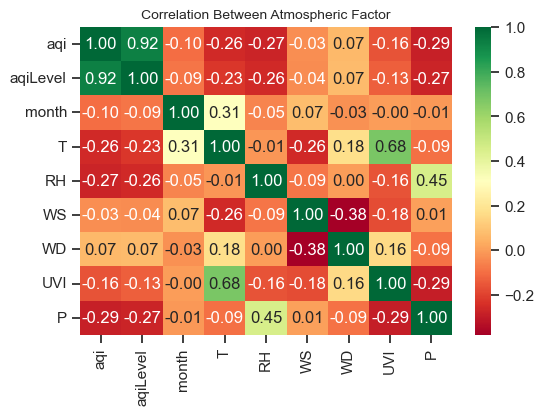

In [32]:
plt.figure(figsize=(6, 4))
sns.heatmap(all_data.corr(), cmap = plt.cm.RdYlGn, annot = True, fmt = '.2f')
sns.set(style = 'ticks', color_codes = True)
plt.title('Correlation Between Atmospheric Factor', fontsize = 10)

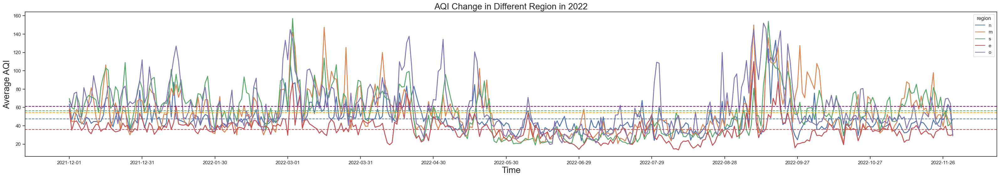

In [33]:
plt.figure(figsize=(40,6))
# fig, ax = plt.subplots()
sns.lineplot(x = '觀測時間(day)', y = 'aqi', data = all_data[-5127:], ci = None, linewidth = 2, hue = 'region', hue_order = ['n', 'm', 's', 'e', 'o'])
# ax.legend().texts[0].set_text('north')
# plt.xticks(rotation=30)
plt.axhline(y = all_data[-5127:].groupby('region')['aqi'].mean()[0], color = 'r', linestyle = '--')
plt.axhline(y = all_data[-5127:].groupby('region')['aqi'].mean()[1], color = 'orange', linestyle = '--')
plt.axhline(y = all_data[-5127:].groupby('region')['aqi'].mean()[2], color = 'b', linestyle = '--')
plt.axhline(y = all_data[-5127:].groupby('region')['aqi'].mean()[3], color = 'purple', linestyle = '--')
plt.axhline(y = all_data[-5127:].groupby('region')['aqi'].mean()[4], color = 'g', linestyle = '--')
ax = plt.gca()
x_major_locator = MultipleLocator(30)
ax.xaxis.set_major_locator(x_major_locator)
plt.title('AQI Change in Different Region in 2022', fontsize = 20)
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Average AQI', fontsize = 20)
plt.show()

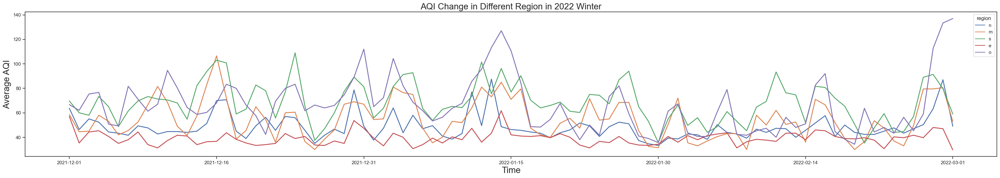

In [35]:
plt.figure(figsize=(40,6))
# fig, ax = plt.subplots()
sns.lineplot(x = '觀測時間(day)', y = 'aqi', data = all_data[-5127:-3815], ci = None, linewidth = 2, hue = 'region', hue_order = ['n', 'm', 's', 'e', 'o'])
# ax.legend().texts[0].set_text('north')
# plt.xticks(rotation=30)
ax = plt.gca()
x_major_locator = MultipleLocator(15)
ax.xaxis.set_major_locator(x_major_locator)
plt.title('AQI Change in Different Region in 2022 Winter', fontsize = 20)
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Average AQI', fontsize = 20)
plt.show()

Text(0, 0.5, 'Average AQI')

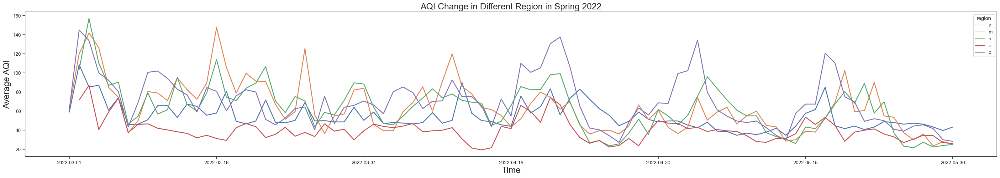

In [39]:
plt.figure(figsize=(40,6))
# fig, ax = plt.subplots()
sns.lineplot(x = '觀測時間(day)', y = 'aqi', data = all_data[-3815:-2560], ci = None, linewidth = 2, hue = 'region', hue_order = ['n', 'm', 's', 'e', 'o'])
# ax.legend().texts[0].set_text('north')
# plt.xticks(rotation=30)
ax = plt.gca()
x_major_locator = MultipleLocator(15)
ax.xaxis.set_major_locator(x_major_locator)
plt.title('AQI Change in Different Region in Spring 2022', fontsize = 20)
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Average AQI', fontsize = 20)

Text(0, 0.5, 'Average AQI')

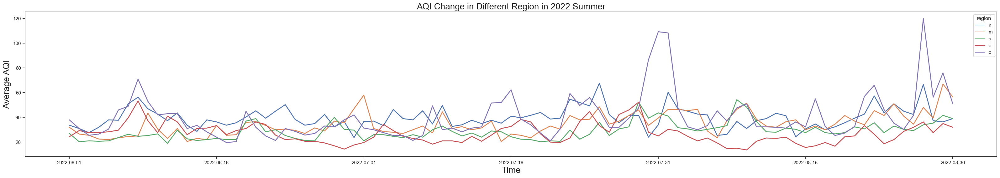

In [40]:
plt.figure(figsize=(40,6))
# fig, ax = plt.subplots()
sns.lineplot(x = '觀測時間(day)', y = 'aqi', data = all_data[-2545:-1287], ci = None, linewidth = 2, hue = 'region', hue_order = ['n', 'm', 's', 'e', 'o'])
# ax.legend().texts[0].set_text('north')
# plt.xticks(rotation=30)
ax = plt.gca()
x_major_locator = MultipleLocator(15)
ax.xaxis.set_major_locator(x_major_locator)
plt.title('AQI Change in Different Region in 2022 Summer', fontsize = 20)
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Average AQI', fontsize = 20)

Text(0, 0.5, 'Average AQI')

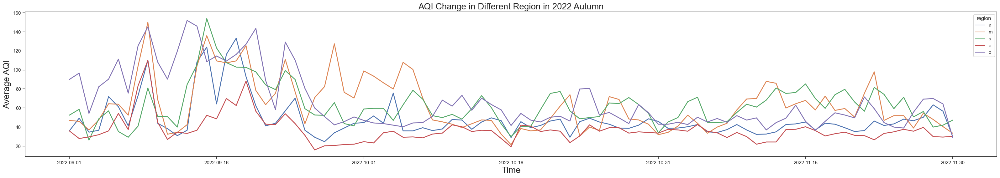

In [41]:
plt.figure(figsize=(40,6))
# fig, ax = plt.subplots()
sns.lineplot(x = '觀測時間(day)', y = 'aqi', data = all_data[-1265:], ci = None, linewidth = 2, hue = 'region', hue_order = ['n', 'm', 's', 'e', 'o'])
# ax.legend().texts[0].set_text('north')
# plt.xticks(rotation=30)
ax = plt.gca()
x_major_locator = MultipleLocator(15)
ax.xaxis.set_major_locator(x_major_locator)
plt.title('AQI Change in Different Region in 2022 Autumn', fontsize = 20)
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Average AQI', fontsize = 20)

In [53]:
!pip install windrose

In [43]:
from windrose import WindroseAxes

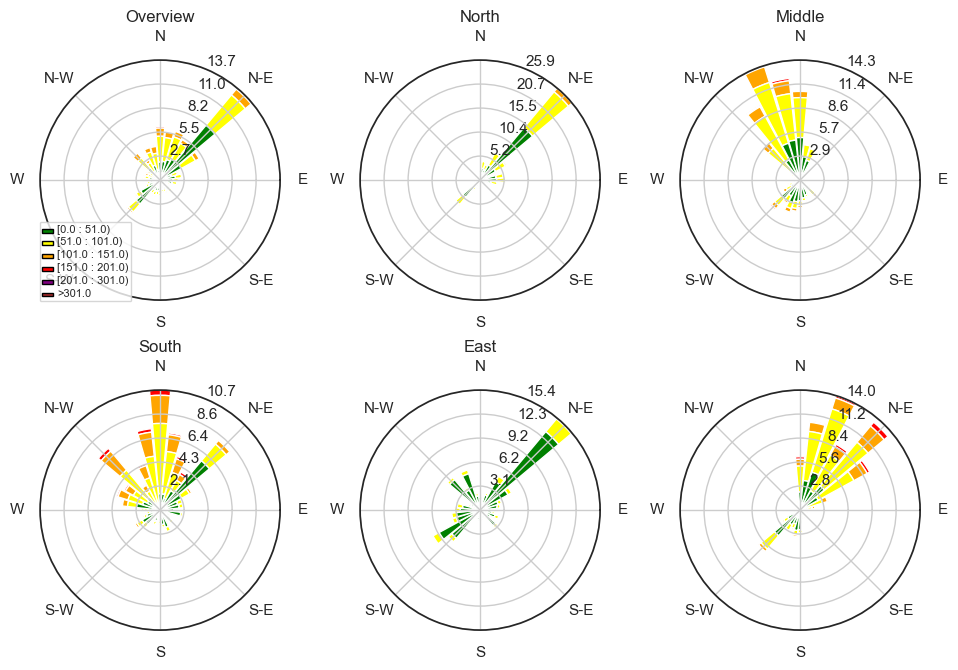

In [44]:
fig = plt.figure(figsize=(8, 6))
rect = [0.1, 0.55, 0.4, 0.4] 
ax = WindroseAxes(fig, rect)
fig.add_axes(ax)
ax.bar(all_data['WD'], all_data['aqi'], bins = [0, 51, 101, 151, 201, 301], 
        colors = ('green', 'yellow', 'orange', 'red', 'purple', 'brown'), nsector = 32, normed = True, opening = 0.9, edgecolor = 'white')
ax.set_legend(labels = ['Good', 'Moderate', 'Unhealthy for \nSensitive Groups', 'Unhealthy', 'Very Unhealthy', 'Hazardous'], fontsize = 4, loc = "lower left")
plt.title('Overview')

rect = [0.5, 0.55, 0.4, 0.4]
ax = WindroseAxes(fig, rect)
fig.add_axes(ax)
ax.bar(all_data[all_data['region'] == 'n']['WD'], all_data[all_data['region'] == 'n']['aqi'], bins = [0, 51, 101, 151, 201, 301], 
        colors = ('green', 'yellow', 'orange', 'red', 'purple', 'brown'), nsector = 32, normed = True, opening = 0.9, edgecolor = 'white')
plt.title('North')

rect = [0.9, 0.55, 0.4, 0.4]
ax=WindroseAxes(fig, rect)
fig.add_axes(ax)
ax.bar(all_data[all_data['region'] == 'm']['WD'], all_data[all_data['region'] == 'm']['aqi'], bins = [0, 51, 101, 151, 201, 301], 
        colors = ('green', 'yellow', 'orange', 'red', 'purple', 'brown'), nsector = 32, normed = True, opening = 0.9, edgecolor = 'white')
plt.title('Middle')

rect = [0.1, 0, 0.4, 0.4] 
ax = WindroseAxes(fig, rect)
fig.add_axes(ax)
ax.bar(all_data[all_data['region'] == 's']['WD'], all_data[all_data['region'] == 's']['aqi'], bins = [0, 51, 101, 151, 201, 301], 
        colors = ('green', 'yellow', 'orange', 'red', 'purple', 'brown'), nsector = 32, normed = True, opening = 0.9, edgecolor = 'white')
plt.title('South')

rect = [0.5, 0, 0.4, 0.4]
ax = WindroseAxes(fig, rect)
fig.add_axes(ax)
ax.bar(all_data[all_data['region'] == 'e']['WD'], all_data[all_data['region'] == 'e']['aqi'], bins = [0, 51, 101, 151, 201, 301], 
        colors = ('green', 'yellow', 'orange', 'red', 'purple', 'brown'), nsector = 32, normed = True, opening = 0.9, edgecolor = 'white')
plt.title('East')

rect = [0.9, 0, 0.4, 0.4]
ax = WindroseAxes(fig, rect)
fig.add_axes(ax)
ax.bar(all_data[all_data['region'] == 'o']['WD'], all_data[all_data['region'] == 'o']['aqi'], bins = [0, 51, 101, 151, 201, 301], 
        colors = ('green', 'yellow', 'orange', 'red', 'purple', 'brown'), nsector = 32, normed = True, opening = 0.9, edgecolor = 'white')

plt.show()

In [77]:
all_data[all_data['觀測時間(day)'].str.contains('2017')]

,sitename,觀測時間(day),aqi,aqiLevel,month,T,RH,WS,WD,UVI,region,P
2684,基隆,2017-01-01,37.0,1,1,21.9,71,1.8,120,5,n,0
2685,馬公,2017-01-01,138.0,3,1,20.0,82,4.3,20,5,o,0
2686,金門,2017-01-01,72.0,2,1,19.1,70,3.0,30,6,o,0
2687,馬祖,2017-01-01,50.0,1,1,15.4,83,3.0,10,5,o,0
2689,宜蘭,2017-01-01,35.0,1,1,20.5,84,1.7,290,6,e,1
...,...,...,...,...,...,...,...,...,...,...,...,...
10642,花蓮,2017-12-28,53.0,2,12,19.7,76,1.9,240,6,e,1
10643,宜蘭,2017-12-28,50.0,1,12,19.3,79,1.7,360,3,e,1
10645,馬祖,2017-12-28,89.0,2,12,13.5,83,3.7,10,1,o,1
10646,金門,2017-12-28,114.0,3,12,16.8,70,2.2,20,3,o,1


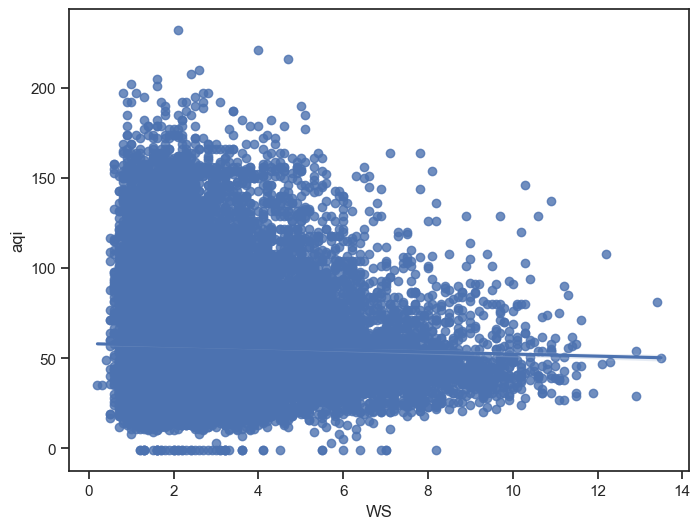

In [190]:
plt.figure(figsize=(8, 6))
sns.regplot(data = all_data, x="WS", y="aqi",)
# plt.ylim(10, 150)
plt.show()

In [175]:
import imageio
# 分辨率
dpi = 96
month = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
filenames = []
# 每年的數據
for i in range(1,13):
    # 關閉交互式繪圖
    plt.ioff()

    # 初始化
    fig = plt.figure(figsize=(680 / dpi, 480 / dpi), dpi=dpi)

    # 篩選數據
    data = all_data[all_data['month'] == i]
    # 生成散點氣泡圖

    sns.kdeplot(data = data, x = 'aqi', fill = True, alpha = 0.1, hue = 'region', hue_order = ['n', 'm', 's', 'e', 'o'], linewidth = 3)
    plt.xlabel('AQI')
    x = np.linspace(0,150,3)
    plt.fill_betweenx(x, 0, 50, color = 'green', alpha = 0.1)
    plt.fill_betweenx(x, 50, 100, color = 'yellow', alpha = 0.1)
    plt.fill_betweenx(x, 100, 150, color = 'orange', alpha = 0.1)

    # 添加相關信息
    #plt.yscale('log')
    plt.title("Distribution of AQI in Different Region in " + month[i-1])
    plt.text(20, 0.014, 'Good', color = 'green')
    plt.text(66, 0.014, 'Moderate', color = '#FFEF00')
    plt.text(109, 0.0135, '   Unhealthy for\nSensitive Groups', color = 'orange')
    plt.ylim(0, 0.015)
    plt.xlim(0, 150)
    plt.legend(labels = ['North', 'Middle', 'South', 'East', 'Outlying'], title = 'Region', loc = 'center right', bbox_to_anchor=(1, 0.6))
    # 保存
    filename = './images/Distribution of AQI in Different Region/' + 'Distribution of AQI in Different Region in ' + month[i-1] + '.png'
    filenames.append(filename)
    plt.savefig(fname=filename, dpi=96)
    plt.gca()
    plt.close(fig)

# 生成GIF動態圖表
with imageio.get_writer('./images/Distribution of AQI in Different Region/Distribution of AQI in Different Region.gif', mode='I', fps = 2.5) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

C:\Users\terry\AppData\Local\Temp\ipykernel_6012\1159936343.py:44: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


In [174]:
import imageio
# 分辨率
dpi = 96
month = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
filenames = []
y = 2016
m = 9

# 每年的數據
while y != 2022 or m != 12:
    # 關閉交互式繪圖
    plt.ioff()

    # 初始化
    fig = plt.figure(figsize=(680 / dpi, 480 / dpi), dpi=dpi)

    # 篩選數據
    data = all_data[all_data['month'] == m]
    data = data[data['觀測時間(day)'].str.contains(str(y))]
    # 生成散點氣泡圖

    sns.kdeplot(data = data, x = 'aqi', fill = True, alpha = 0.1, hue = 'region', hue_order = ['n', 'm', 's', 'e', 'o'], linewidth = 3)
    plt.xlabel('AQI')
#     plt.axvline(x = 50, color = 'green')
#     plt.axvline(x = 100, color = 'yellow')
    x = np.linspace(0,150,3)
    plt.fill_betweenx(x, 0, 50, color = 'green', alpha = 0.1)
    plt.fill_betweenx(x, 50, 100, color = 'yellow', alpha = 0.1)
    plt.fill_betweenx(x, 100, 150, color = 'orange', alpha = 0.1)
    # 添加相關信息
    #plt.yscale('log')
    plt.title("Distribution of AQI in Different Region in " + month[m-1] + " " + str(y))
    plt.text(20, 0.014, 'Good', color = 'green')
    plt.text(66, 0.014, 'Moderate', color = '#FFEF00')
    plt.text(109, 0.0135, '   Unhealthy for\nSensitive Groups', color = 'orange')
    plt.ylim(0, 0.015)
    plt.xlim(0, 150)
    plt.legend(labels = ['North', 'Middle', 'South', 'East', 'Outlying'], title = 'Region', loc = 'center right', bbox_to_anchor=(1, 0.6))
    # 保存
    filename = './images/Distribution of AQI in Different Region from 2016 to 2022/' + 'Distribution of AQI in Different Region in ' + month[m-1] + " " + str(y) + '.png'
    filenames.append(filename)
    plt.savefig(fname=filename, dpi=96)
    plt.gca()
    plt.close(fig)
    if(m == 12):
        y += 1
        m = 1
    else:
        m += 1

# 生成GIF動態圖表
with imageio.get_writer('./images/Distribution of AQI in Different Region from 2016 to 2022/Distribution of AQI in Different Region from 2016 to 2022.gif', mode='I', fps = 3) as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

C:\Users\terry\AppData\Local\Temp\ipykernel_6012\1892877447.py:54: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


['T', 'RH', 'WS', 'UVI', 'P']


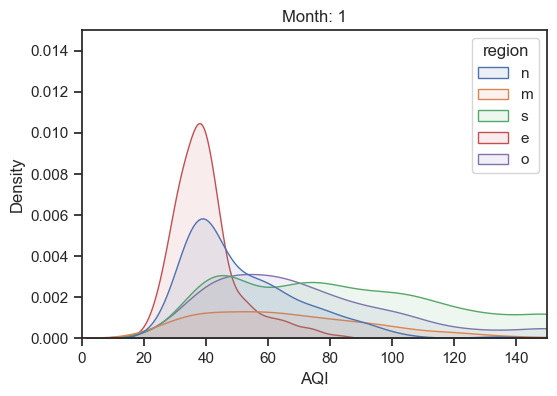

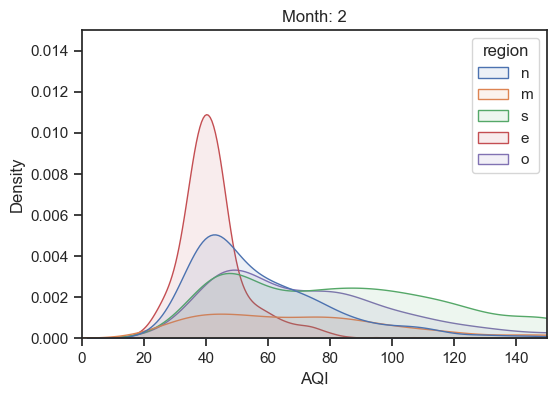

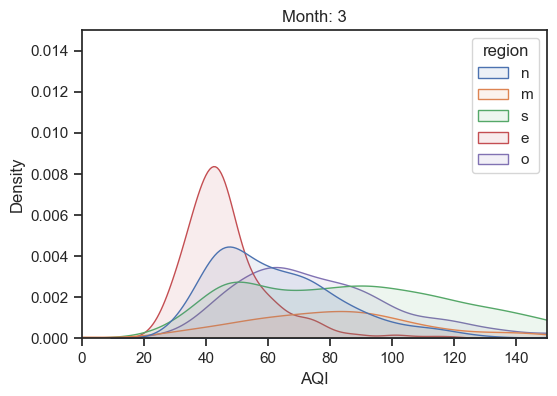

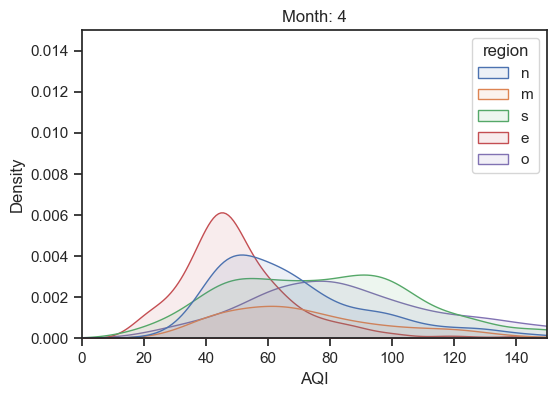

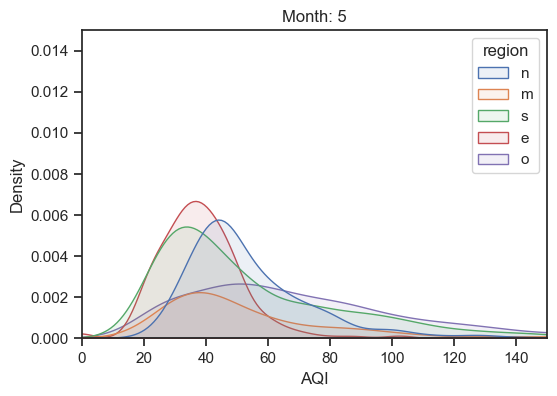

...

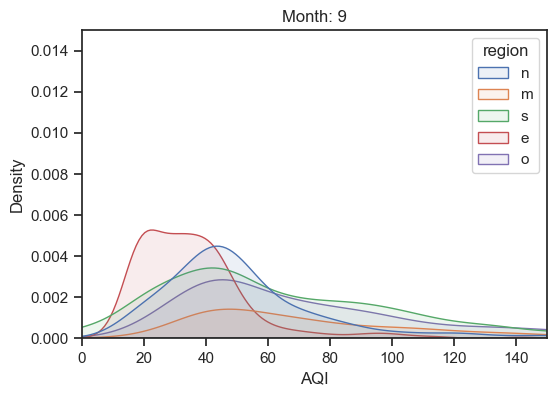

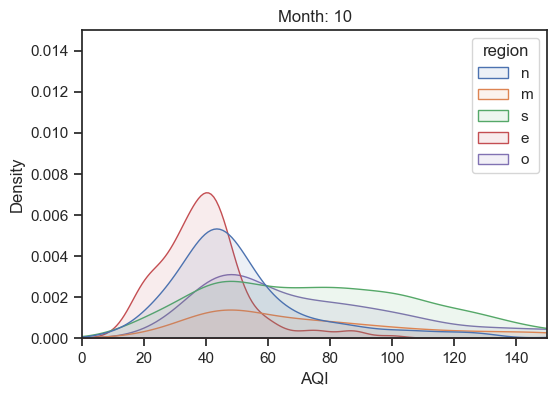

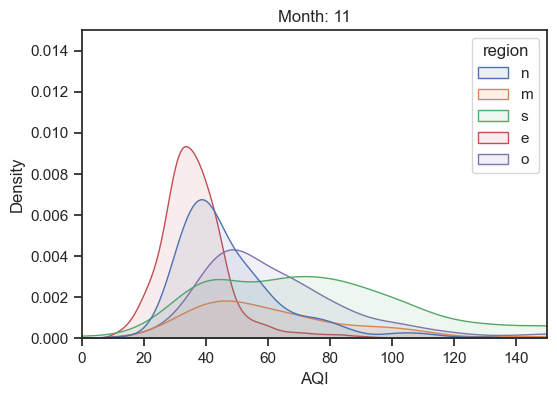

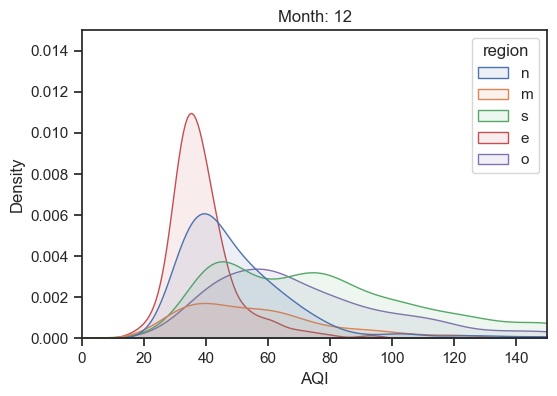

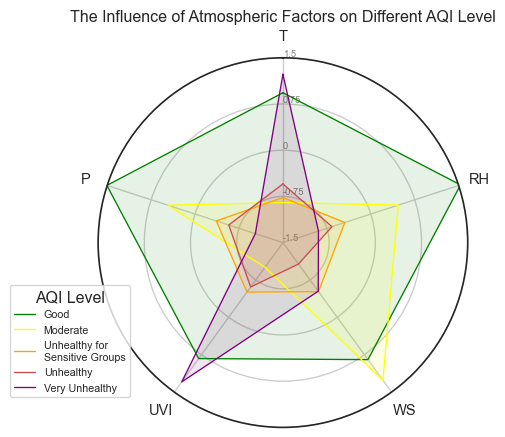

In [144]:
from math import pi

# 設置數據
df = pd.concat([pd.DataFrame({'AQILevel':['1', '2', '3', '4', '5']}, index = [1,2,3,4,5]), 
           all_data.groupby('aqiLevel')[['T']].mean(), all_data.groupby('aqiLevel')[['RH']].mean(), 
           all_data.groupby('aqiLevel')[['WS']].mean(), all_data.groupby('aqiLevel')[['UVI']].mean(),
           all_data.groupby('aqiLevel')[['P']].mean()], axis = 1)
df.index = ([0,1,2,3,4])
df['T'] = (df['T'] - df['T'].mean()) / df["T"].std()
df['RH'] = (df['RH'] - df['RH'].mean()) / df["RH"].std()
df['WS'] = (df['WS'] - df['WS'].mean()) / df["WS"].std()
df['UVI'] = (df['UVI'] - df['UVI'].mean()) / df["UVI"].std()
df['P'] = (df['P'] - df['P'].mean()) / df["P"].std()


# 目標數量
categories = list(df)[1:]
N = len(categories)
print(categories)
# 角度
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

# 初始化
ax = plt.subplot(111, polar=True)

# 設置第一處
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)

# 添加背景信息
plt.xticks(angles[:-1], categories)
ax.set_rlabel_position(0)
plt.yticks([-1.5, -0.75, 0, 0.75, 1.5], ['-1.5', '-0.75', '0', '0.75', '1.5'], color="grey", size=7)
plt.ylim(-1.5, 1.5)

# 添加數據圖

# 第一個
values = df.loc[0].drop('AQILevel').values.flatten().tolist()
values += values[:1]

ax.plot(angles, values, linewidth=1, linestyle='solid', label="Good", color = 'green')
ax.fill(angles, values, 'green', alpha=0.1)

# 第二個
values = df.loc[1].drop('AQILevel').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="Moderate", color = 'yellow')
ax.fill(angles, values, 'yellow', alpha=0.1)

# 第三個
values = df.loc[2].drop('AQILevel').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="Unhealthy for \nSensitive Groups", color = 'orange')
ax.fill(angles, values, 'orange', alpha=0.1)

# 第四個
values = df.loc[3].drop('AQILevel').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="Unhealthy", color = 'r')
ax.fill(angles, values, 'r', alpha=0.1)

# 第五個
values = df.loc[4].drop('AQILevel').values.flatten().tolist()
values += values[:1]
ax.plot(angles, values, linewidth=1, linestyle='solid', label="Very Unhealthy", color = 'purple')
ax.fill(angles, values, 'purple', alpha=0.1)

# 添加圖例
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.4), title = 'AQI Level', fontsize = 8)
plt.title('The Influence of Atmospheric Factors on Different AQI Level')

# 顯示
plt.show()

In [38]:
mpl.matplotlib_fname()

'C:\\Users\\terry\\anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\matplotlibrc'

In [39]:
from matplotlib.font_manager import findfont, FontProperties  
findfont(FontProperties(family=FontProperties().get_family()))

'C:\\Windows\\Fonts\\arial.ttf'